# 07 scenarios flat foundation — 平坦・摩擦・gait 基礎

**対象:** お客様（MPC 設計経験者）との **理論・数式・パラメータ** ディスカッション  
**Part 1/4** — Scenario 01–05

各シナリオは **路面 · 速度 · 勾配 · 実装** を結びつけています。  
理論の前提: [00_theory_grf_mpc_wbc.ipynb](./00_theory_grf_mpc_wbc.ipynb)  
QA 索引: [11_qa_discussion_master.ipynb](./11_qa_discussion_master.ipynb)

```bash
python scripts/scenario_labs.py --list
python scripts/scenario_labs.py --scenario sc01_flat_mu_ice
```


In [1]:
import sys
from pathlib import Path

# mpc_dog ルートを sys.path に追加
ROOT = Path.cwd()
for p in [ROOT, *ROOT.parents]:
    if (p / "scripts" / "pympc_lab.py").exists():
        ROOT = p
        break
sys.path.insert(0, str(ROOT / "scripts"))

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from pympc_lab import (
    TUNING_GUIDE,
    apply_preset,
    compare_runs,
    load_param_study,
    load_preset_yaml,
    plot_friction_cone,
    run_flat_sim,
    run_speed_terrain_sim,
    run_speed_terrain_sim_resilient,
)

from tuning_labs import (
    TUNING_LABS,
    list_labs,
    run_lab,
    run_lab_pair,
    plot_speed_trial_journey,
    plot_param_study_mu,
    load_cached_lab_results,
)

%matplotlib inline
plt.rcParams["figure.figsize"] = (9, 4)
print(f"repo: {ROOT}")

from scenario_labs import (
    SCENARIO_LABS,
    compare_preset_table,
    run_scenario,
    run_scenario_pair,
    scenario_table,
)


repo: /home/takuya/work/mpc_dog


### 平坦・摩擦（Session 1–2）

Markdown の `![](../assets/...)` だけでは IDE 内で見えないことがあります。下のセルで **GIF を直接表示** します。

--- s01_flat ---
  scene: flat
  final_x_m: 1.267
  gif_playback_s: 10.0


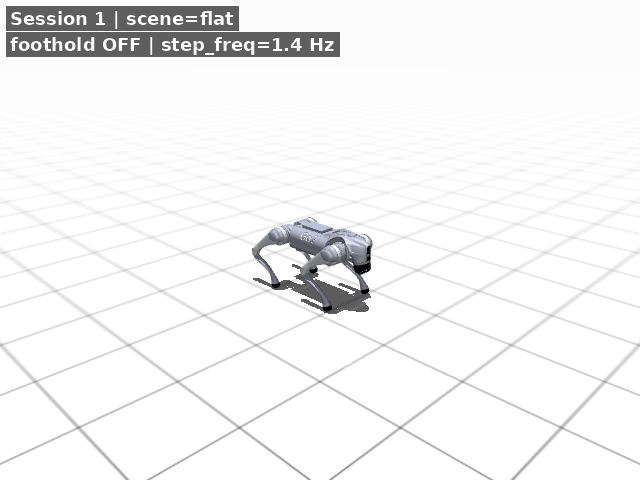

--- s02_tune ---
  scene: flat
  final_x_m: 1.263
  gif_playback_s: 10.0


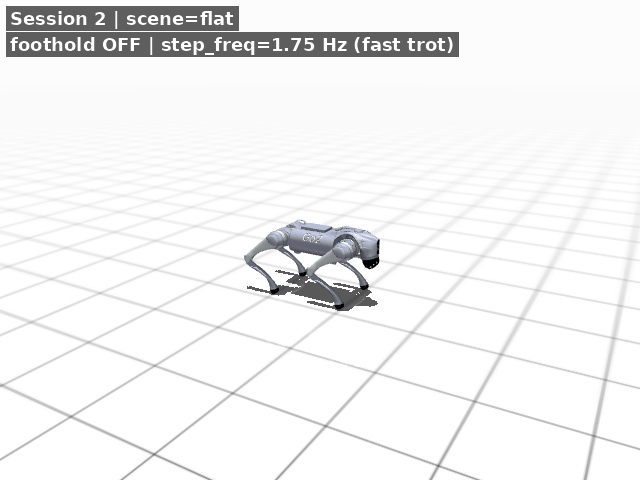

In [2]:
from pathlib import Path
import sys
import json
from IPython.display import Image, display

ROOT = Path.cwd()
for p in [ROOT, *ROOT.parents]:
    if (p / "scripts" / "pympc_lab.py").exists():
        ROOT = p
        break

def show_demo_gifs(tags):
    for tag in tags:
        gif = ROOT / f"docs/pympc_2day/assets/demo_{tag}.gif"
        meta_path = ROOT / f"docs/pympc_2day/assets/demo_{tag}.meta.json"
        print(f"--- {tag} ---")
        if meta_path.is_file():
            m = json.loads(meta_path.read_text())
            for k in ("scene", "final_x_m", "final_dist_m", "gif_playback_s", "falls"):
                if m.get(k) is not None:
                    print(f"  {k}: {m[k]}")
        if gif.is_file():
            display(Image(filename=str(gif)))
        else:
            print("  MISSING:", gif)

show_demo_gifs(["s01_flat", "s02_tune"])


## Scenario 01 — 低μ平坦 — 摩擦円錐が支配する

| 項目 | 内容 |
|------|------|
| **ID** | `sc01_flat_mu_ice` |
| **分類** | flat / basic |
| **路面** | flat（チェッカー平坦） |
| **速度** | — kph |
| **勾配** | flat |
| **preset** | `session02_flat_tune` |

### シナリオ

地面摩擦が低い（氷・濡れ床相当）と、同じ垂直力でも水平 GRF を取れない。

### 理論（Layer 2–3）

Layer 2 MPC の接触制約。stance 足 $i$ で $\sqrt{F_{ix}^2+F_{iy}^2}\le\mu F_{iz}$。

$$|F_{t,i}| \le \mu F_{z,i}, \quad m a_x \approx \frac{1}{N_{st}}\sum_{i\in stance} F_{ix}$$

### パラメータ焦点

| `mu` | 0.55 → 0.28 | MPC 摩擦円錐の傾き |

**実装:** `pympc_lab.run_flat_sim` → `mpc_params.mu`

### ノウハウ

μ↓は加速↓だが姿勢は安定。sim 地面摩擦と MPC μ は別物。

### 議論用 Q&A

Q: μを上げると vx は上がるはずなのに転倒するのは？
A: 円錐は開くが実際の地面摩擦を超える GRF 計画→スリップ・姿勢崩れ。


backup: /home/takuya/work/mpc_dog/logs/pympc_sessions/session02_flat_tune/config.py.bak.20260818T221800Z
applied: session02_flat_tune -> /home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/config.py
notes: 03_sessions_runbook.md のチューニング表を参照。


/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


field AcadosOcpDims.N has been migrated to AcadosOcpOptions.N_horizon. setting AcadosOcpOptions.N_horizon = N. For future comppatibility, please use AcadosOcpOptions.N_horizon directly.
External functions generated in 83.810 ms.


Templated solver code generated in 1180.458 ms.
rm -f libacados_ocp_solver_ocp_centroidal_model_5432c2dd.so
rm -f centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.c
cc -fPIC -std=c99 

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o acados_solver_ocp_centroidal_model_5432c2dd.o acados_solver_ocp_centroidal_model_5432c2dd.c


cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/cen

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_adj.o centroidal_model_model/centroidal_model_expl_vde_adj.c
cc -shared centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/centroidal_model_expl_vde

/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


backup: /home/takuya/work/mpc_dog/logs/pympc_sessions/session02_flat_tune/config.py.bak.20260818T221812Z
applied: session02_flat_tune -> /home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/config.py
notes: 03_sessions_runbook.md のチューニング表を参照。
field AcadosOcpDims.N has been migrated to AcadosOcpOptions.N_horizon. setting AcadosOcpOptions.N_horizon = N. For future comppatibility, please use AcadosOcpOptions.N_horizon directly.
External functions generated in 83.233 ms.


Templated solver code generated in 1188.003 ms.
rm -f libacados_ocp_solver_ocp_centroidal_model_5432c2dd.so
rm -f centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.c
cc -fPIC -std=c99 

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o acados_solver_ocp_centroidal_model_5432c2dd.o acados_solver_ocp_centroidal_model_5432c2dd.c


cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/cen

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_adj.o centroidal_model_model/centroidal_model_expl_vde_adj.c
cc -shared centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/centroidal_model_expl_vde

/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 20302 (\N{CJK UNIFIED IDEOGRAPH-4F4E}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 24179 (\N{CJK UNIFIED IDEOGRAPH-5E73}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 22374 (\N{CJK UNIFIED IDEOGRAPH-5766}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 25705 (\N{CJK UNIFIED IDEOGRAPH-6469}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 25830 (\N{CJK UNIFIED IDEOGRAPH-64E6}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 20870 (\N{CJK UNIFIED IDEOGRAPH-5186}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/taku

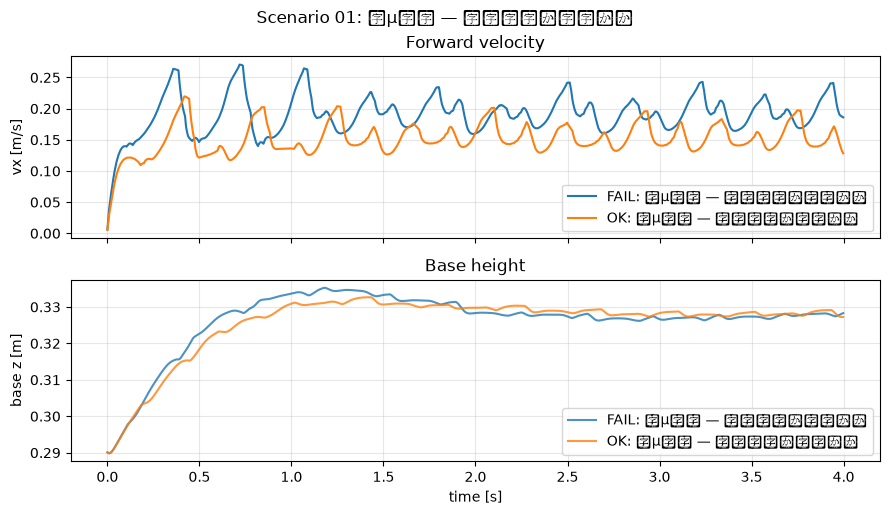

In [3]:
from scenario_labs import run_scenario_pair
from pympc_lab import compare_runs

pair = run_scenario_pair("sc01_flat_mu_ice")
fig = compare_runs(pair)
plt.suptitle("Scenario 01: 低μ平坦 — 摩擦円錐が支配する", y=1.02)
plt.show()


## Scenario 02 — 平坦・攻め gait — horizon 内の支持周期

| 項目 | 内容 |
|------|------|
| **ID** | `sc02_flat_aggressive_gait` |
| **分類** | flat / basic |
| **路面** | flat |
| **速度** | — kph |
| **勾配** | flat |
| **preset** | `session02_flat_tune` |

### シナリオ

Session 2 の速い trot (1.6 Hz) を平坦で試すと、MPC ホライゾン 0.24 s 内で支持→遊脚の切替が追いつかない。

### 理論（Layer 2–3）

Layer 1 が $s_i(k)$ を生成。step_freq↑ → 支持時間 $T_{stance}=duty/freq$ 短縮。

$$T_{stance} = \frac{duty}{f_{step}}, \quad N \Delta t \ge T_{cycle} \text{ が設計目安}$$

### パラメータ焦点

| `step_freq` | 1.6 → 1.2 | 支持時間確保 |

**実装:** `simulation_params.gait_params.trot.step_freq`

### ノウハウ

平坦でも freq 上限あり。不整地前に「MPC が解ける gait」を確認。

### 議論用 Q&A

Q: 実機で freq を上げれば速くなる？
A: 解ける QP + WBC 追従 + 着地精度の3条件が必要。


backup: /home/takuya/work/mpc_dog/logs/pympc_sessions/session02_flat_tune/config.py.bak.20260818T221824Z
applied: session02_flat_tune -> /home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/config.py
notes: 03_sessions_runbook.md のチューニング表を参照。
field AcadosOcpDims.N has been migrated to AcadosOcpOptions.N_horizon. setting AcadosOcpOptions.N_horizon = N. For future comppatibility, please use AcadosOcpOptions.N_horizon directly.
External functions generated in 81.813 ms.


Templated solver code generated in 1157.162 ms.
rm -f libacados_ocp_solver_ocp_centroidal_model_5432c2dd.so
rm -f centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.c
cc -fPIC -std=c99 

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o acados_solver_ocp_centroidal_model_5432c2dd.o acados_solver_ocp_centroidal_model_5432c2dd.c


cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/cen

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_adj.o centroidal_model_model/centroidal_model_expl_vde_adj.c
cc -shared centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/centroidal_model_expl_vde

/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


backup: /home/takuya/work/mpc_dog/logs/pympc_sessions/session02_flat_tune/config.py.bak.20260818T221835Z
applied: session02_flat_tune -> /home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/config.py
notes: 03_sessions_runbook.md のチューニング表を参照。
field AcadosOcpDims.N has been migrated to AcadosOcpOptions.N_horizon. setting AcadosOcpOptions.N_horizon = N. For future comppatibility, please use AcadosOcpOptions.N_horizon directly.
External functions generated in 81.969 ms.


Templated solver code generated in 1209.929 ms.
rm -f libacados_ocp_solver_ocp_centroidal_model_5432c2dd.so
rm -f centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.c
cc -fPIC -std=c99 

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o acados_solver_ocp_centroidal_model_5432c2dd.o acados_solver_ocp_centroidal_model_5432c2dd.c


cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/cen

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_adj.o centroidal_model_model/centroidal_model_expl_vde_adj.c
cc -shared centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/centroidal_model_expl_vde

/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 24179 (\N{CJK UNIFIED IDEOGRAPH-5E73}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 22374 (\N{CJK UNIFIED IDEOGRAPH-5766}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 12539 (\N{KATAKANA MIDDLE DOT}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 25915 (\N{CJK UNIFIED IDEOGRAPH-653B}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 12417 (\N{HIRAGANA LETTER ME}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 20869 (\N{CJK UNIFIED IDEOGRAPH-5185}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog

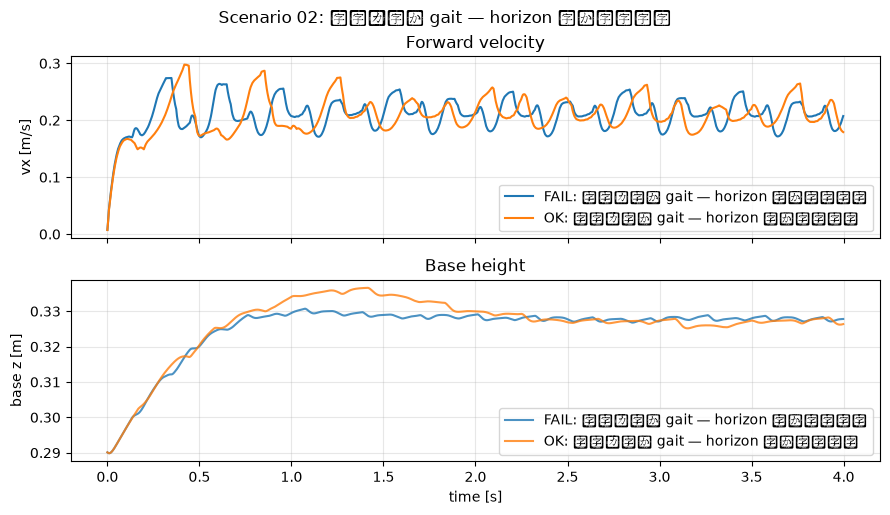

In [4]:
from scenario_labs import run_scenario_pair
from pympc_lab import compare_runs

pair = run_scenario_pair("sc02_flat_aggressive_gait")
fig = compare_runs(pair)
plt.suptitle("Scenario 02: 平坦・攻め gait — horizon 内の支持周期", y=1.02)
plt.show()


## Scenario 03 — ref_z 不足 — SRB 高さ参照の下限

| 項目 | 内容 |
|------|------|
| **ID** | `sc03_flat_ref_z_low` |
| **分類** | flat / basic |
| **路面** | flat |
| **速度** | — kph |
| **勾配** | flat |
| **preset** | `session01_flat_smoke` |

### シナリオ

CoM 高さ参照が低いと、WBC が脚を縮めすぎて即転倒（MPC 以前の問題）。

### 理論（Layer 2–3）

状態参照 $\mathbf{x}^{ref}$ の $z$ 成分 = `ref_z`。SRB 並進は $\sum F_{iz}\approx mg$ で支持。

$$ref_z = k \cdot h_{hip}, \quad k \gtrsim 1.05 \text{（Go2 目安）}$$

### パラメータ焦点

| `ref_z_scale` | 0.95 → 1.08 | CoM 目標高 |

**実装:** `simulation_params.ref_z = hip_height * ref_z_scale`

### ノウハウ

転倒の第一チェック: ref_z → duty → μ の順。

### 議論用 Q&A

Q: ref_z を上げると不安定になることは？
A: 限界を超えると脚伸展限界・オーバーシュート。1.05–1.10 で探索。


backup: /home/takuya/work/mpc_dog/logs/pympc_sessions/session01_flat_smoke/config.py.bak.20260818T221846Z
applied: session01_flat_smoke -> /home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/config.py
notes: 起動後5秒待ってから ↑ キー。GRF 緑矢印を確認。
field AcadosOcpDims.N has been migrated to AcadosOcpOptions.N_horizon. setting AcadosOcpOptions.N_horizon = N. For future comppatibility, please use AcadosOcpOptions.N_horizon directly.
External functions generated in 84.993 ms.


Templated solver code generated in 1228.824 ms.
rm -f libacados_ocp_solver_ocp_centroidal_model_5432c2dd.so
rm -f centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.c
cc -fPIC -std=c99 

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o acados_solver_ocp_centroidal_model_5432c2dd.o acados_solver_ocp_centroidal_model_5432c2dd.c


cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/cen

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_adj.o centroidal_model_model/centroidal_model_expl_vde_adj.c
cc -shared centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/centroidal_model_expl_vde

/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


backup: /home/takuya/work/mpc_dog/logs/pympc_sessions/session01_flat_smoke/config.py.bak.20260818T221857Z
applied: session01_flat_smoke -> /home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/config.py
notes: 起動後5秒待ってから ↑ キー。GRF 緑矢印を確認。
field AcadosOcpDims.N has been migrated to AcadosOcpOptions.N_horizon. setting AcadosOcpOptions.N_horizon = N. For future comppatibility, please use AcadosOcpOptions.N_horizon directly.
External functions generated in 85.140 ms.


Templated solver code generated in 1231.082 ms.
rm -f libacados_ocp_solver_ocp_centroidal_model_5432c2dd.so
rm -f centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.c
cc -fPIC -std=c99 

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o acados_solver_ocp_centroidal_model_5432c2dd.o acados_solver_ocp_centroidal_model_5432c2dd.c


cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/cen

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_adj.o centroidal_model_model/centroidal_model_expl_vde_adj.c
cc -shared centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/centroidal_model_expl_vde

/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 19981 (\N{CJK UNIFIED IDEOGRAPH-4E0D}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 36275 (\N{CJK UNIFIED IDEOGRAPH-8DB3}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 39640 (\N{CJK UNIFIED IDEOGRAPH-9AD8}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 12373 (\N{HIRAGANA LETTER SA}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 21442 (\N{CJK UNIFIED IDEOGRAPH-53C2}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 29031 (\N{CJK UNIFIED IDEOGRAPH-7167}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/

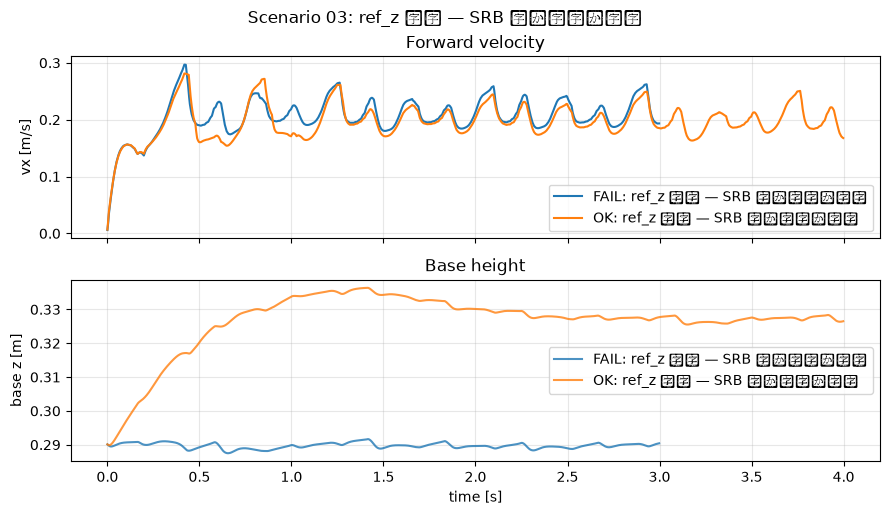

In [5]:
from scenario_labs import run_scenario_pair
from pympc_lab import compare_runs

pair = run_scenario_pair("sc03_flat_ref_z_low")
fig = compare_runs(pair)
plt.suptitle("Scenario 03: ref_z 不足 — SRB 高さ参照の下限", y=1.02)
plt.show()


## Scenario 04 — duty 不足 — 支持脚が足りない

| 項目 | 内容 |
|------|------|
| **ID** | `sc04_flat_duty_low` |
| **分類** | flat / intermediate |
| **路面** | flat |
| **速度** | — kph |
| **勾配** | flat |
| **preset** | `session02_flat_tune` |

### シナリオ

duty_factor=0.55 では遊脚比率が高く、単脚支持で姿勢を支えきれない。

### 理論（Layer 2–3）

支持脚数 $N_{stance}(k)=\sum s_i(k)$。duty↓ → 同時支持が減り $F_{iz}$ 配分が難化。

$$N_{stance} \ge 2 \text{（trot 対角）}, \quad \sum_{i\in stance} F_{iz} \approx mg$$

### パラメータ焦点

| `duty_factor` | 0.55 → 0.75 | 支持比率 |

**実装:** `gait_params.trot.duty_factor`

### ノウハウ

不整地・下り坂ほど duty↑（0.78–0.82）。

### 議論用 Q&A

Q: duty=1 に近づけるとベスト？
A: 遊脚がなく段差を越えられない。地形で 0.70–0.82 を調整。


backup: /home/takuya/work/mpc_dog/logs/pympc_sessions/session02_flat_tune/config.py.bak.20260818T221909Z
applied: session02_flat_tune -> /home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/config.py
notes: 03_sessions_runbook.md のチューニング表を参照。
field AcadosOcpDims.N has been migrated to AcadosOcpOptions.N_horizon. setting AcadosOcpOptions.N_horizon = N. For future comppatibility, please use AcadosOcpOptions.N_horizon directly.
External functions generated in 83.681 ms.


Templated solver code generated in 1216.829 ms.
rm -f libacados_ocp_solver_ocp_centroidal_model_5432c2dd.so
rm -f centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.c
cc -fPIC -std=c99 

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o acados_solver_ocp_centroidal_model_5432c2dd.o acados_solver_ocp_centroidal_model_5432c2dd.c


cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/cen

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_adj.o centroidal_model_model/centroidal_model_expl_vde_adj.c
cc -shared centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/centroidal_model_expl_vde

/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


backup: /home/takuya/work/mpc_dog/logs/pympc_sessions/session02_flat_tune/config.py.bak.20260818T221922Z
applied: session02_flat_tune -> /home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/config.py
notes: 03_sessions_runbook.md のチューニング表を参照。
field AcadosOcpDims.N has been migrated to AcadosOcpOptions.N_horizon. setting AcadosOcpOptions.N_horizon = N. For future comppatibility, please use AcadosOcpOptions.N_horizon directly.
External functions generated in 84.541 ms.


Templated solver code generated in 1233.968 ms.
rm -f libacados_ocp_solver_ocp_centroidal_model_5432c2dd.so
rm -f centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.c
cc -fPIC -std=c99 

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o acados_solver_ocp_centroidal_model_5432c2dd.o acados_solver_ocp_centroidal_model_5432c2dd.c


cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/cen

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_adj.o centroidal_model_model/centroidal_model_expl_vde_adj.c
cc -shared centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_5432c2dd.o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/centroidal_model_expl_vde

/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 19981 (\N{CJK UNIFIED IDEOGRAPH-4E0D}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 36275 (\N{CJK UNIFIED IDEOGRAPH-8DB3}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 25903 (\N{CJK UNIFIED IDEOGRAPH-652F}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 25345 (\N{CJK UNIFIED IDEOGRAPH-6301}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 33050 (\N{CJK UNIFIED IDEOGRAPH-811A}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 12364 (\N{HIRAGANA LETTER GA}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/

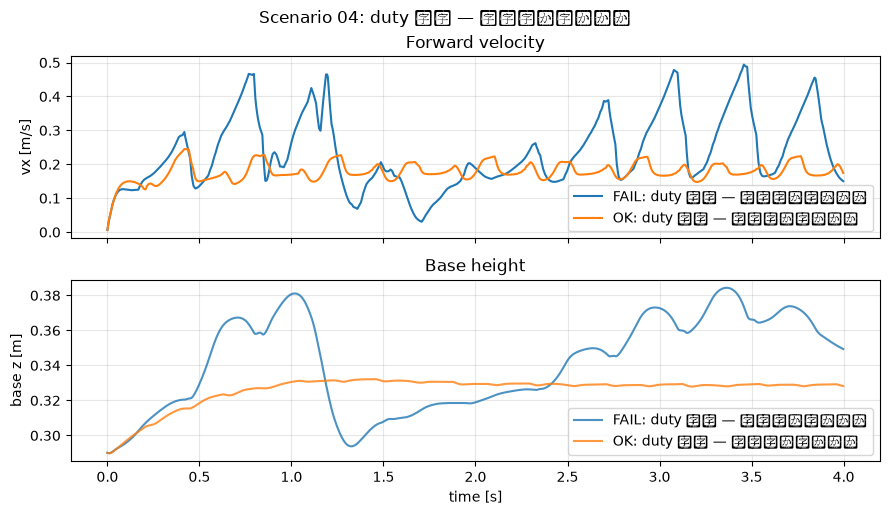

In [6]:
from scenario_labs import run_scenario_pair
from pympc_lab import compare_runs

pair = run_scenario_pair("sc04_flat_duty_low")
fig = compare_runs(pair)
plt.suptitle("Scenario 04: duty 不足 — 支持脚が足りない", y=1.02)
plt.show()


## Scenario 05 — grf_max 過大 — 垂直力ソフト制限

| 項目 | 内容 |
|------|------|
| **ID** | `sc05_flat_grf_max` |
| **分類** | flat / intermediate |
| **路面** | flat |
| **速度** | — kph |
| **勾配** | flat |
| **preset** | `session02_flat_tune` |

### シナリオ

垂直 GRF 上限が高すぎると跳ね・関節飽和。低すぎると支持不足。

### 理論（Layer 2–3）

各足 $F_{iz}^{min}\le F_{iz}\le F_{iz}^{max}$。`grf_max` が $F_{iz}^{max}$ に相当。

$$F_{iz}^{max} \approx \frac{mg}{N_{stance}} \times \text{safety}, \quad \text{Go2: } mg/4 \times 1.2$$

### パラメータ焦点

| `grf_max` | 500N → 120N | 垂直 GRF 上限 |

**実装:** `mpc_params.grf_max`

### ノウハウ

跳ね→grf_max↓。加速不足→grf_max↑（μ とセットで）。

### 議論用 Q&A

Q: grf_max と mu のどちらを先に触る？
A: 跳ね/飽和→grf_max、横滑り/転倒→μ。


backup: /home/takuya/work/mpc_dog/logs/pympc_sessions/session02_flat_tune/config.py.bak.20260818T221933Z
applied: session02_flat_tune -> /home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/config.py
notes: 03_sessions_runbook.md のチューニング表を参照。
field AcadosOcpDims.N has been migrated to AcadosOcpOptions.N_horizon. setting AcadosOcpOptions.N_horizon = N. For future comppatibility, please use AcadosOcpOptions.N_horizon directly.
External functions generated in 85.660 ms.


Templated solver code generated in 1248.512 ms.
rm -f libacados_ocp_solver_ocp_centroidal_model_d0334ccb.so
rm -f centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_d0334ccb.o
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.c
cc -fPIC -std=c99 

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o acados_solver_ocp_centroidal_model_d0334ccb.o acados_solver_ocp_centroidal_model_d0334ccb.c


cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/cen

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_adj.o centroidal_model_model/centroidal_model_expl_vde_adj.c
cc -shared centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_d0334ccb.o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/centroidal_model_expl_vde

/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


backup: /home/takuya/work/mpc_dog/logs/pympc_sessions/session02_flat_tune/config.py.bak.20260818T221945Z
applied: session02_flat_tune -> /home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/config.py
notes: 03_sessions_runbook.md のチューニング表を参照。
field AcadosOcpDims.N has been migrated to AcadosOcpOptions.N_horizon. setting AcadosOcpOptions.N_horizon = N. For future comppatibility, please use AcadosOcpOptions.N_horizon directly.
External functions generated in 85.219 ms.


Templated solver code generated in 1247.760 ms.
rm -f libacados_ocp_solver_ocp_centroidal_model_c8050056.so
rm -f centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_c8050056.o
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.c
cc -fPIC -std=c99 

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o acados_solver_ocp_centroidal_model_c8050056.o acados_solver_ocp_centroidal_model_c8050056.c


cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/cen

cc -fPIC -std=c99   -O2 -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/acados -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/blasfeo/include -I/home/takuya/work/mpc_dog/external/Quadruped-PyMPC/quadruped_pympc/acados/include/hpipm/include  -c -o centroidal_model_model/centroidal_model_expl_vde_adj.o centroidal_model_model/centroidal_model_expl_vde_adj.c
cc -shared centroidal_model_constraints/centroidal_model_constr_h_0_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_0_fun.o centroidal_model_constraints/centroidal_model_constr_h_fun_jac_uxt_zt.o centroidal_model_constraints/centroidal_model_constr_h_fun.o acados_solver_ocp_centroidal_model_c8050056.o centroidal_model_model/centroidal_model_expl_ode_fun.o centroidal_model_model/centroidal_model_expl_vde_forw.o centroidal_model_model/centroidal_model_expl_vde

/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:231: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/home/takuya/work/mpc_dog/.venv/lib/python3.11/site-packages/gymnasium/spaces/box.py:297: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 36942 (\N{CJK UNIFIED IDEOGRAPH-904E}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 22823 (\N{CJK UNIFIED IDEOGRAPH-5927}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 22402 (\N{CJK UNIFIED IDEOGRAPH-5782}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 30452 (\N{CJK UNIFIED IDEOGRAPH-76F4}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 21147 (\N{CJK UNIFIED IDEOGRAPH-529B}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/mpc_dog/scripts/pympc_lab.py:596: UserWarning: Glyph 12477 (\N{KATAKANA LETTER SO}) missing from font(s) DejaVu Sans.
  fig.tight_layout()
/home/takuya/work/

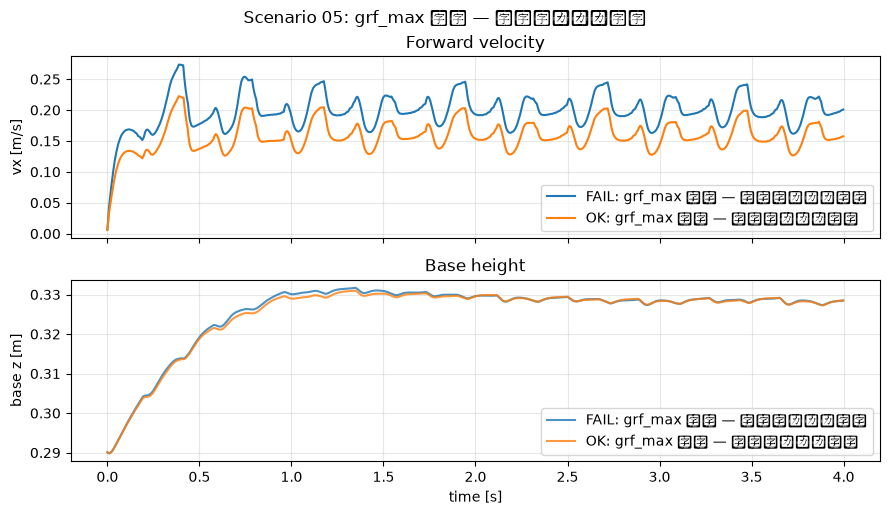

In [7]:
from scenario_labs import run_scenario_pair
from pympc_lab import compare_runs

pair = run_scenario_pair("sc05_flat_grf_max")
fig = compare_runs(pair)
plt.suptitle("Scenario 05: grf_max 過大 — 垂直力ソフト制限", y=1.02)
plt.show()


---

## Part 1 チェックリスト

- [ ] Scenario 01–05 それぞれ **数式 → パラメータ → 結果** を説明できる  
- [ ] fail / OK の差が **摩擦円錐 · gait · 指令 ramp** のどれか特定できる  
- [ ] `configs/pympc_presets/` の YAML と対応づけられる  

**次:** [08_scenarios_rough_speed.ipynb](./08_scenarios_rough_speed.ipynb)
